<a href="https://colab.research.google.com/github/joowop/Metaverse_AI_Project/blob/main/img_opencv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2

from google.colab.patches import cv2_imshow

In [ ]:
src = cv2.imread('starry_night.jpg', cv2.IMREAD_GRAYSCALE)

src.shape

(640, 1024)

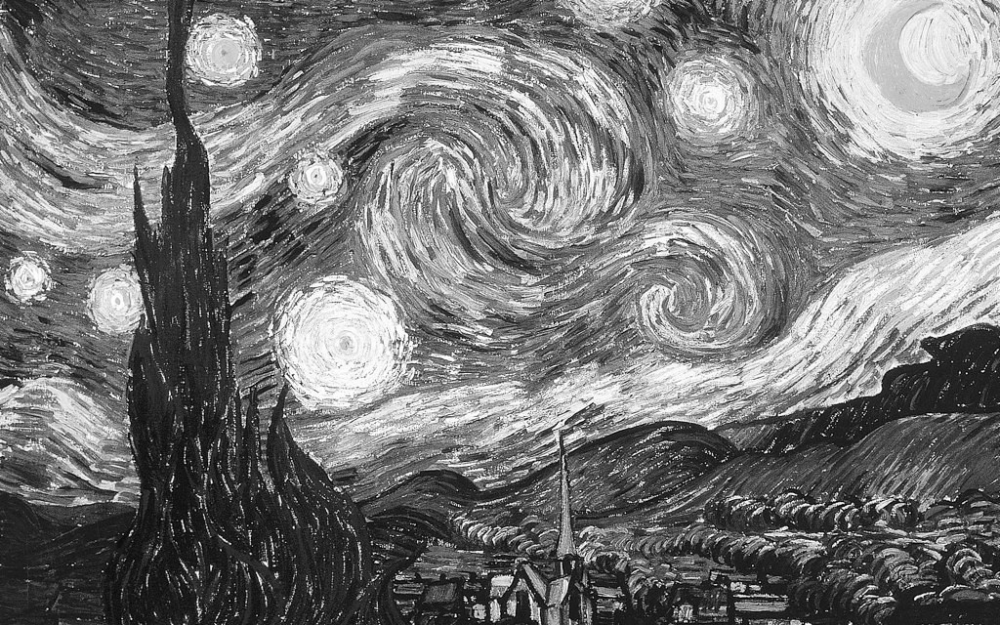

In [ ]:
cv2_imshow(src)

# 밝기 조절

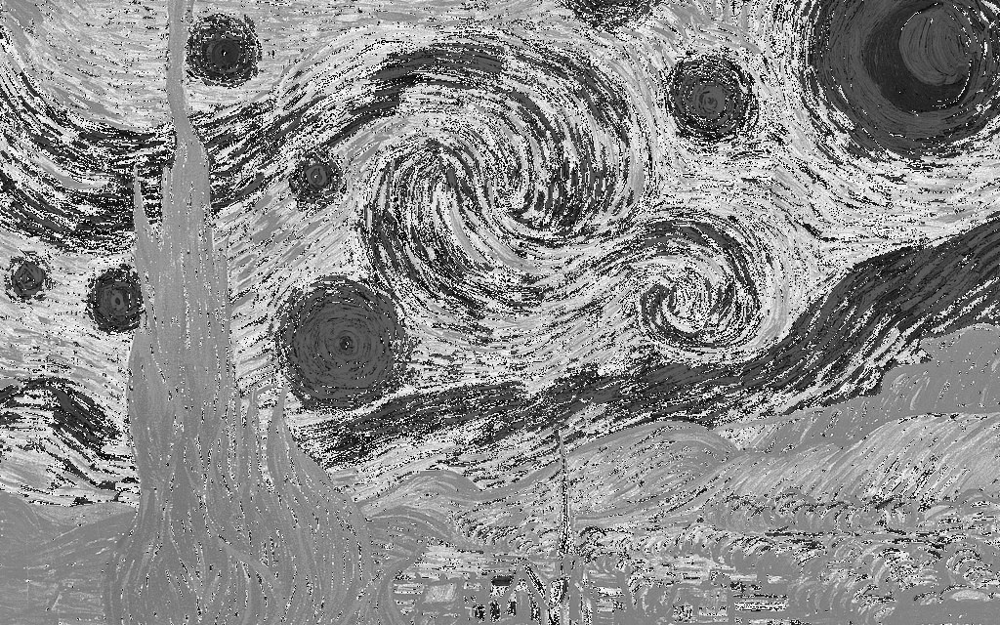

In [ ]:
dst1 = src + 100
cv2_imshow(dst1)

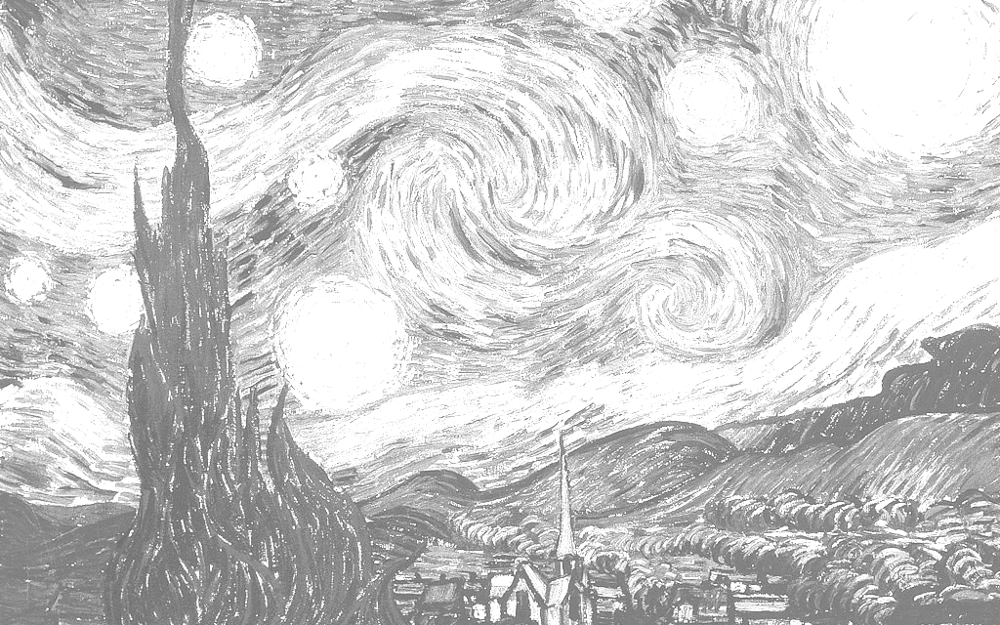

In [ ]:
dst2 = cv2.add(src, 100)
cv2_imshow(dst2)

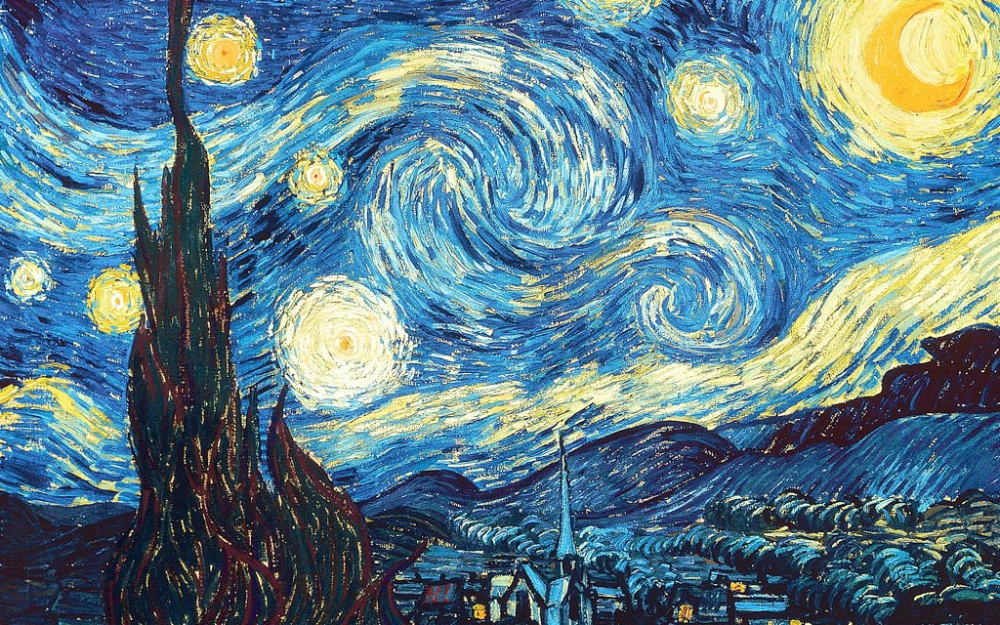

In [ ]:
src = cv2.imread('starry_night.jpg')
cv2_imshow(src)

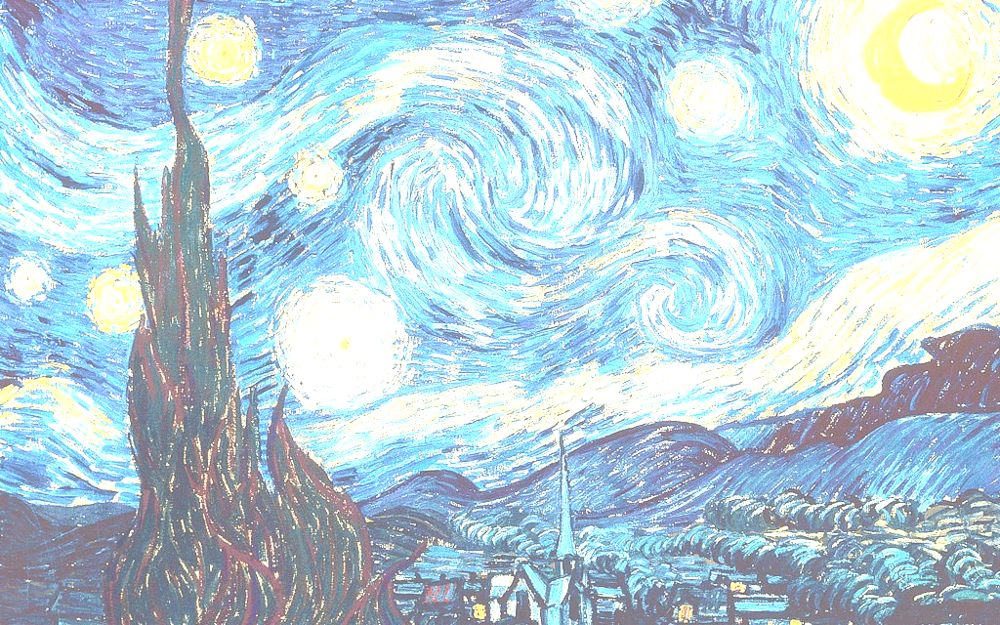

In [ ]:
dst1= cv2.add(src, (100,100,100,0))
cv2_imshow(dst1)

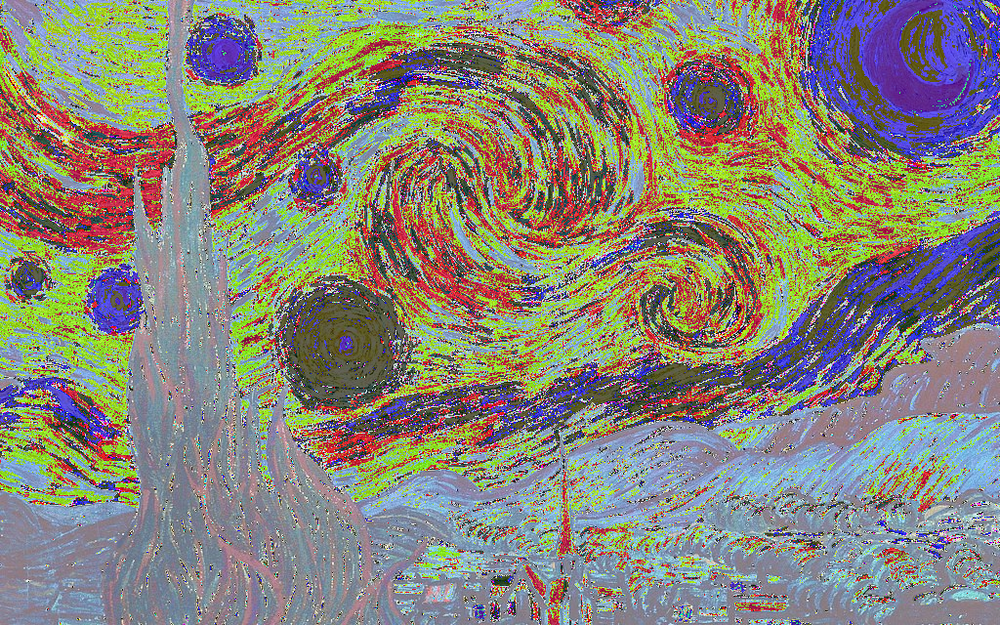

In [ ]:
import numpy as np
dst2= np.clip(src+100, 0, 255).astype(np.uint8)
cv2_imshow(dst2)

In [ ]:
src = cv2.imread('starry_night.jpg')

b,g,r = cv2.split(src)
b

array([[109, 130, 164, ..., 141, 110,  94],
       [149, 136, 162, ...,  79, 132, 115],
       [132, 118, 195, ...,  90, 124, 143],
       ...,
       [ 35,  36,  35, ...,  37,  42,  38],
       [ 45,  41,  38, ...,  35,  40,  40],
       [ 47,  39,  36, ...,  30,  41,  44]], dtype=uint8)

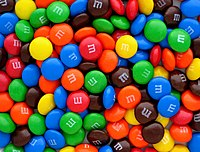

In [ ]:
src = cv2.imread('MnM.jpg')
cv2_imshow(src)

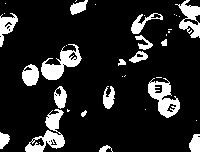

In [ ]:
dst_b = cv2.inRange(src, (129,0,0), (255,128,128))
cv2_imshow(dst_b)

In [ ]:
dst = np.zeros((152, 200,3), dtype = np.uint8)
cv2.copyTo(src, dst_b, dst)

array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [218, 103,   0],
        [220, 102,   0],
        [222, 103,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [217, 101,   0],
        [219, 101,   0],
        [220, 102,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [214, 100,   0],
        [218, 100,   0],
        [218, 100,   0]]

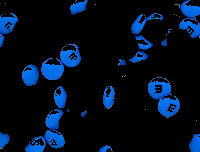

In [ ]:
cv2_imshow(dst)

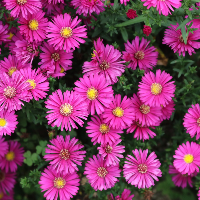

In [ ]:
src = cv2.imread('gerbera jamesonii.jpg')
src = cv2.resize(src, (200, 200))
cv2_imshow(src)

In [ ]:
dst = []

for sigma in range(1,6):
    dst.append(cv2.GaussianBlur(src,(0,0),sigma))



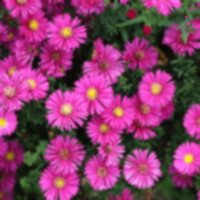

In [ ]:
cv2_imshow(dst[0])

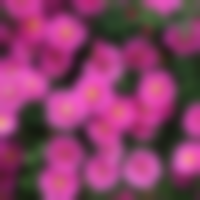

In [ ]:
cv2_imshow(dst[-1])

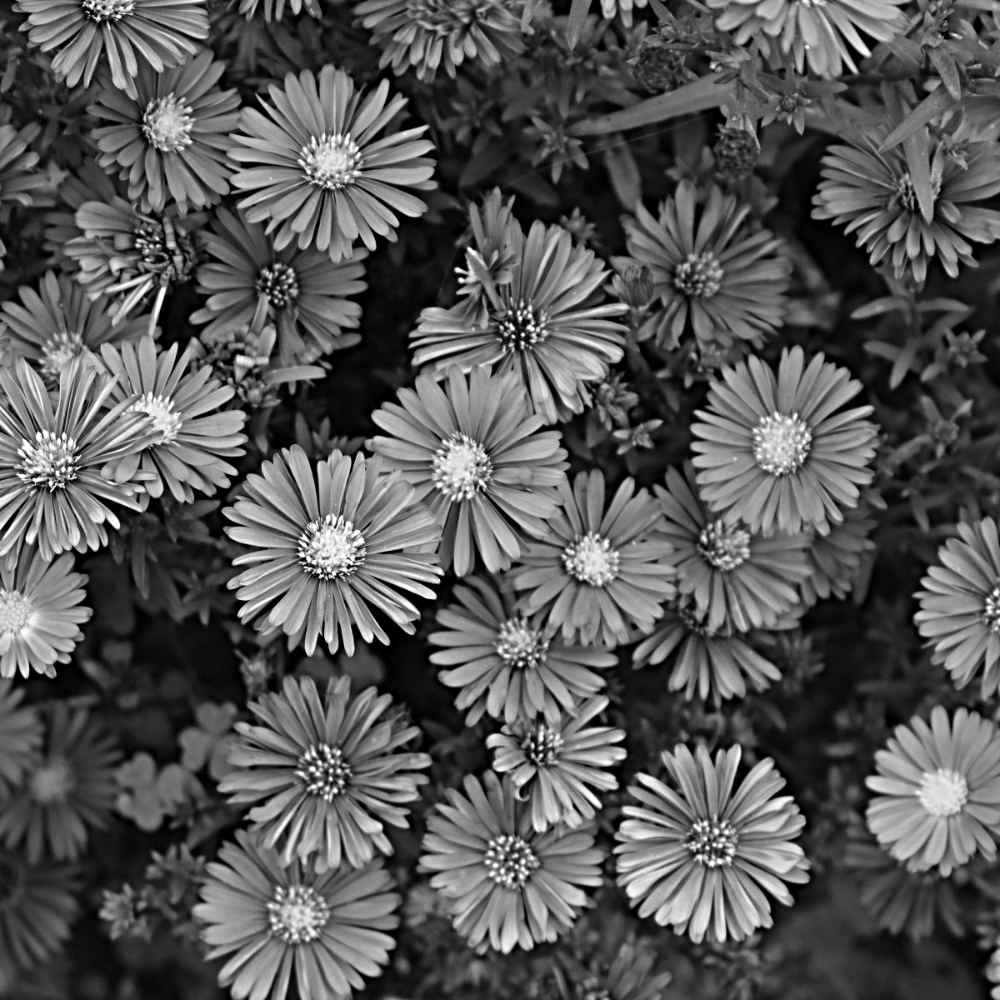

In [ ]:
src = cv2.imread('gerbera jamesonii.jpg', cv2.IMREAD_GRAYSCALE)

src_f = src.astype(np.float32)
bir = cv2.GaussianBlur(src_f, (0,0), 6,0)

dst = np.clip(2. * src_f - bir, 0, 255).astype(np.uint8)

cv2_imshow(dst)

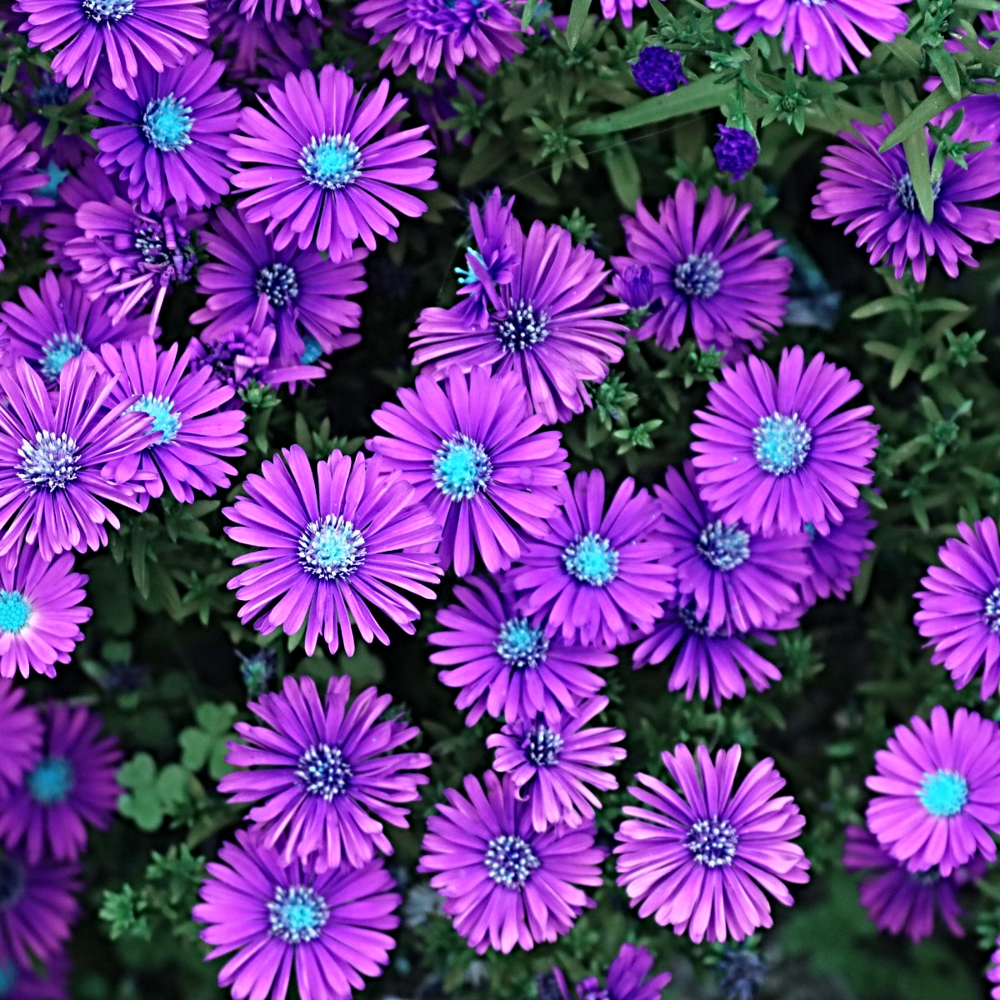

In [ ]:
src = cv2.imread('gerbera jamesonii.jpg')

src_ycrcb = cv2.cvtColor(src, cv2.COLOR_BGR2YCrCb)

src_f = src_ycrcb[:,:,0].astype(np.float32)
bir = cv2.GaussianBlur(src_f, (0,0), 6.0)
src_ycrcb[:,:,0] = np.clip(2.*src_f - bir, 0, 255).astype(np.uint8)
dst = cv2.cvtColor(src_ycrcb, cv2.COLOR_YCrCb2RGB)
cv2_imshow(dst)

# Noise 제거

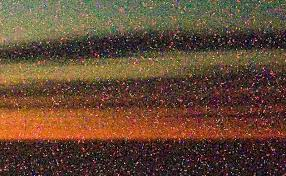

In [ ]:
src = cv2.imread('noise.jpg')
cv2_imshow(src)

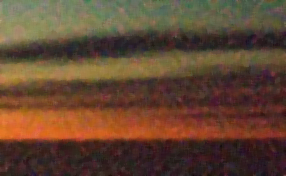

In [ ]:
dst = cv2.medianBlur(src, 5)
cv2_imshow(dst)

# 원근이 있는 이미지 ocr?

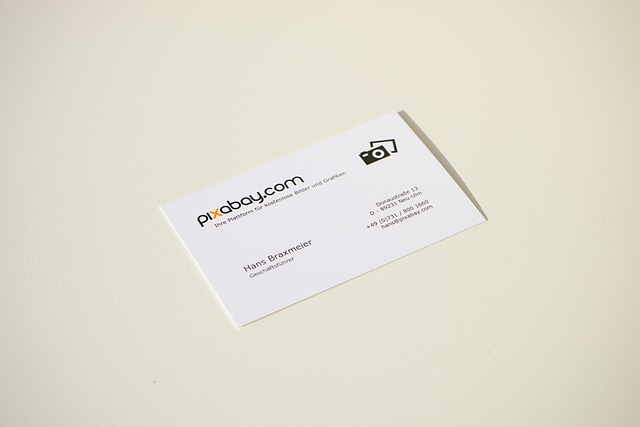

In [ ]:
src = cv2.imread('business-card_640.jpg')
cv2_imshow(src)

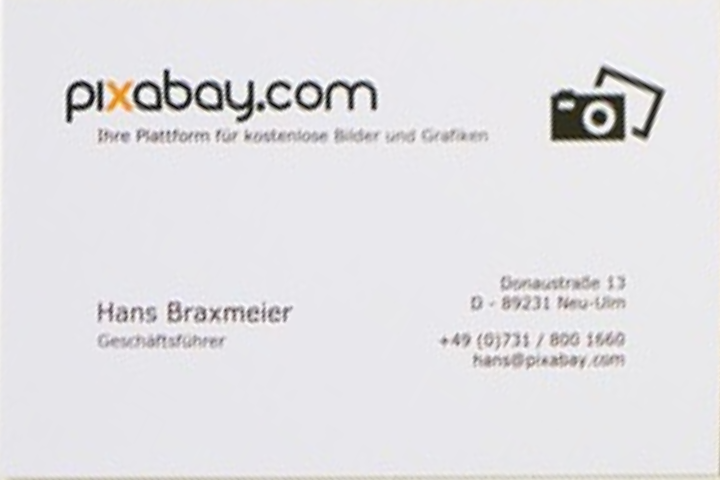

In [ ]:
w, h = 720, 480

srcQuard = np.array([[160, 207], [395,112], [487,221], [239,327]], np.float32)
dstQuard = np.array([[0,0], [w-1,0], [w-1,h-1],[0,h-1]],np.float32) # 좌표를잡고 평평하게 핀다.

pers = cv2.getPerspectiveTransform(srcQuard, dstQuard)

dst = cv2.warpPerspective(src, pers, (w,h))

cv2_imshow(dst)

# 연습 문제 스캐너

In [ ]:
import numpy as np
import sys
import cv2

def drawROI(img, corners):
    cpy = img.copy()

    c1 = (192,192,255)
    c2 = (128,128,255)

    for pt in corners:
        cv2.circle(cpy, tuple(pt.astype(int)), 25, c1, -1, cv2.LINE_AA)

    cv2.line(cpy,tuple(corners[0].astype(int)), tuple(corners[1].astype(int)), c2, 2, cv2.LINE_AA)
    cv2.line(cpy,tuple(corners[1].astype(int)), tuple(corners[2].astype(int)), c2, 2, cv2.LINE_AA)
    cv2.line(cpy,tuple(corners[2].astype(int)), tuple(corners[3].astype(int)), c2, 2, cv2.LINE_AA)
    cv2.line(cpy,tuple(corners[3].astype(int)), tuple(corners[0].astype(int)), c2, 2, cv2.LINE_AA)

    disp = cv2.addWeighted(img, 0.3, cpy, 0.7, 0)
    return disp

def onMouse(event, x, y, flags, param):
    global srcQuad, dragSrc, ptOld, src

    if event == cv2.EVENT_LBUTTONDOWN:
        for i in range(4):
            if cv2.norm(srcQuard[i] - (x, y)) < 25:
                dragSrc[i] = True
                ptOld = (x,y)
                break
    if event == cv2.EVENT_MOUSEMOVE:
        for i in range(4):
            if dragSrc[i]:
                dx = x - ptOld[0]
                dy = y - ptOld[1]

                srcQuard[i] += (dx, dy)